In [1]:
import pandas as pd

In [2]:
data = pd.read_csv('bitstampUSD_1-min_data_2012-01-01_to_2020-04-22.csv')
data.head()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
0,1325317920,4.39,4.39,4.39,4.39,0.455581,2.0,4.39
1,1325317980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1325318040,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1325318100,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1325318160,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
data.isnull().sum()

Timestamp                  0
Open                 1236977
High                 1236977
Low                  1236977
Close                1236977
Volume_(BTC)         1236977
Volume_(Currency)    1236977
Weighted_Price       1236977
dtype: int64

In [4]:
data.columns

Index(['Timestamp', 'Open', 'High', 'Low', 'Close', 'Volume_(BTC)',
       'Volume_(Currency)', 'Weighted_Price'],
      dtype='object')

In [5]:
data = data.drop(['Open', 'High', 'Low', 'Volume_(BTC)',
       'Volume_(Currency)', 'Weighted_Price'], axis=1)

In [6]:
data.head()

,Timestamp,Close
0,1325317920,4.39
1,1325317980,NaN
2,1325318040,NaN
3,1325318100,NaN
4,1325318160,NaN


In [7]:
data['Timestamp'] = pd.to_datetime(data['Timestamp'], unit='s')
data.head()

,Timestamp,Close
0,2011-12-31 07:52:00,4.39
1,2011-12-31 07:53:00,NaN
2,2011-12-31 07:54:00,NaN
3,2011-12-31 07:55:00,NaN
4,2011-12-31 07:56:00,NaN


In [8]:
data = data[data['Timestamp'].dt.year >= 2018]

In [9]:
data = data.resample('h', on='Timestamp').mean()

In [14]:
data.head()

,Timestamp,Close
0,2018-01-01 00:00:00,13700.708167
1,2018-01-01 01:00:00,13567.449333
2,2018-01-01 02:00:00,13414.742167
3,2018-01-01 03:00:00,13512.315254
4,2018-01-01 04:00:00,13531.850833


In [11]:
data = data.reset_index()

In [12]:
data['Close'] = data['Close'].ffill()

In [13]:
data.isnull().sum()

Timestamp    0
Close        0
dtype: int64

In [15]:
from sklearn.preprocessing import MinMaxScaler

norm = MinMaxScaler()

In [16]:
training_data = norm.fit_transform(data[['Close']])

In [17]:
print(training_data)

[[0.75520159]
 [0.74567125]
 [0.73475001]
 ...
 [0.26860279]
 [0.26756009]
 [0.26529901]]


In [18]:
result = []
for i in range(len(training_data) - 24):
    result.append(training_data[i: i+24])


In [19]:
print(result)

[array([[0.75520159],
       [0.74567125],
       [0.73475001],
       [0.7417282 ],
       [0.74312533],
       [0.74497163],
       [0.75308607],
       [0.76075852],
       [0.7475612 ],
       [0.74587085],
       [0.74514959],
       [0.72444845],
       [0.72811057],
       [0.71485773],
       [0.70432558],
       [0.72338784],
       [0.71674204],
       [0.71750297],
       [0.71943892],
       [0.71987048],
       [0.73616483],
       [0.7476691 ],
       [0.74600664],
       [0.73630149]]), array([[0.74567125],
       [0.73475001],
       [0.7417282 ],
       [0.74312533],
       [0.74497163],
       [0.75308607],
       [0.76075852],
       [0.7475612 ],
       [0.74587085],
       [0.74514959],
       [0.72444845],
       [0.72811057],
       [0.71485773],
       [0.70432558],
       [0.72338784],
       [0.71674204],
       [0.71750297],
       [0.71943892],
       [0.71987048],
       [0.73616483],
       [0.7476691 ],
       [0.74600664],
       [0.73630149],
       [0.

In [20]:
import numpy as np 

result = np.array(result)

In [21]:
print(result.shape)

(20185, 24, 1)


In [22]:
train_data = result[:int(training_data.shape[0] * .8), :]
test_data = result[int(training_data.shape[0] * .8):,:]

In [23]:
train_data.shape

(16167, 24, 1)

In [30]:
x_train = train_data[:, :-1]
x_train.shape

(16167, 23, 1)

In [31]:
y_train = train_data[:, -1]
y_train.shape

(16167, 1)

In [32]:
x_test = test_data[:, :-1]
y_test = test_data[:, -1]

In [26]:
x_test.shape

(4018, 23, 1)

In [33]:
y_test.shape

(4018, 1)

In [34]:
import tensorflow.keras as k
import tensorflow as tf

In [190]:
l2 = k.regularizers.l2


In [35]:



input_data = k.Input(shape=(x_train.shape[1], 1))
x = k.layers.LSTM(units=24, return_sequences=True)(input_data)
x = k.layers.Dropout(.1)(x)
x = k.layers.LSTM(units=24)(x)
x = k.layers.Dropout(.1)(x)
x = k.layers.Dense(units=1)(x)
model = k.models.Model(inputs=input_data, outputs=x)
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

2025-09-05 15:09:38.425570: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [36]:
early_stop = k.callbacks.EarlyStopping(patience=3, monitor='val_loss')

model.fit(x_train, y_train, epochs=10, shuffle=False,  callbacks=[early_stop], validation_split=.2)

Epoch 1/10


405/405 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.0164 - mse: 0.0164 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 2/10
405/405 ━━━━━━━━━━━━━━━━━━━━ 33s 58ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 3/10
405/405 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 4/10
405/405 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0039 - val_mse: 0.0039


In [37]:
model.evaluate(x_test, y_test)

126/126 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0045 - mse: 0.0045


[0.004514110274612904, 0.004514110274612904]

In [38]:
model.save('model.h5')

In [39]:
from sklearn.metrics import r2_score

y_pred = model.predict(x_test)



126/126 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step


In [40]:
y_pred.shape

(4018, 1)

In [41]:
r2 = r2_score(y_test, y_pred)

In [43]:
import matplotlib.pyplot as plt

y_pred = model.predict(x_test)
y_pred = norm.inverse_transform(y_pred)
y_test = norm.inverse_transform(y_test)

126/126 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step


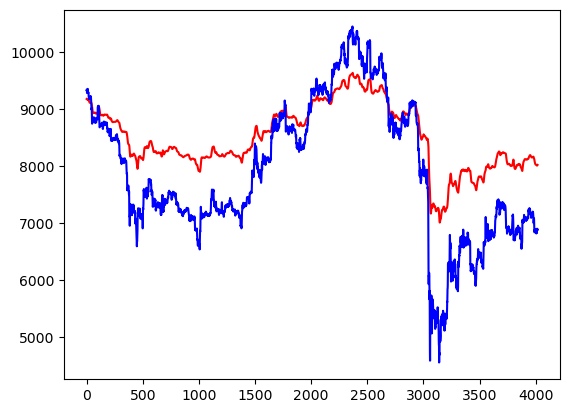

In [46]:
plt.plot(y_pred, color='red')
plt.plot(y_test, color='blue')
plt.show()